# t-SNE (T-Distributed Stochastic Neighbor Embedding)
It is a dimensionality reduction technique, and it’s particularly well suited for the visualization of high-dimensional data sets. Unlike PCA, its a probabilistic in nature. 

We will use the Modified National Institute of Standards and Technology (MNIST) data set.  We use this dataset because its high dimensional having 784 features/dimensions

In [1]:
from __future__ import print_function
import time

import numpy as np
import pandas as pd

from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import seaborn as sns

# Load dataset

In [2]:
X, y = fetch_openml('mnist_784', version=1, return_X_y=True, as_frame=False)
print(X.shape, y.shape) # rows, columns

(70000, 784) (70000,)


In [3]:
# Lets print 1st data and its label
print(f"1st record of X:\n {X[0]}")
print("#################################")
print(f"1st label of y: {y[0]}")

1st record of X:
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   3  18  18  18 126 136 175  26 166 255
 247 127   0   0   0   0   0   0   0   0   0   0   0   0  30  36  94 154
 170 253 253 253 253 253 225 172 253 242 195  64   0   0   0   0   0   0
   0   0   0   0   0  49 238 253 253 253 253 253 253 253 253 251  93  82
  82  56  39   0   0   0   0   0   0   0   0   0   0   0   0  18 219 253
 253 253 253 253 198 182 247 241 

### The numerical values of pixel represent the gray sclae number ranging from 0 - 255. There are 784 pixels in this data. To visually see the digit, convert 784 into 28X28.

In [4]:
print(f"1st record of X:\n {X[0].reshape(28, 28)}") # reshaped 784 into 28X28 by pixels
print(f"1st record of y: {y[0]}")

1st record of X:
 [[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0   0   0   0   3  18  18  18 126 136
  175  26 166 255 247 127   0   0   0   0]
 [  0   0   0   0   0   0   0   0  30  36  94 154 170 253 253 253 253 253
  225 172 253 242 195  64   0   0   0   0]
 [  0   0   0   0   0   0   0  49 238 253 253 253 253 253 253 253 253 251
   93  82  82  56  39   0   0   0   0   0]
 [  0   0   0   0   0   0   0  18 219 253 253 

In [5]:
X = X / 255.0 # normalize the features
print(f"1st record of X:\n {X[0]}")

1st record of X:
 [0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.  

# Prettify
Lets make feature names as pixel0, pixel1, pixel2, ...


In [6]:
feat_cols = [ 'pixel'+str(i) for i in range(X.shape[1]) ]

df = pd.DataFrame(X,columns=feat_cols)
df['y'] = y
df["y"] = df["y"].astype(int)

X, y = None, None # lets free space

print('Size of the dataframe: {}'.format(df.shape))

print(df[:3])
print(df.describe())
print("%%%%%%%%%%%%%%%%%%%%%")
print(df.info())

Size of the dataframe: (70000, 785)
   pixel0  pixel1  pixel2  pixel3  pixel4  pixel5  pixel6  pixel7  pixel8  \
0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
1     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   
2     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0     0.0   

   pixel9  ...  pixel775  pixel776  pixel777  pixel778  pixel779  pixel780  \
0     0.0  ...       0.0       0.0       0.0       0.0       0.0       0.0   
1     0.0  ...       0.0       0.0       0.0       0.0       0.0       0.0   
2     0.0  ...       0.0       0.0       0.0       0.0       0.0       0.0   

   pixel781  pixel782  pixel783  y  
0       0.0       0.0       0.0  5  
1       0.0       0.0       0.0  0  
2       0.0       0.0       0.0  4  

[3 rows x 785 columns]
        pixel0   pixel1   pixel2   pixel3   pixel4   pixel5   pixel6   pixel7  \
count  70000.0  70000.0  70000.0  70000.0  70000.0  70000.0  70000.0  70000.0   
mean    

## Interesting observation
If you notice, you will see that entries in pixel0, pixel1, pixel2,..,pixel9 are all 0.

We’ll take a random subset of the digits because we don’t want to be using 70,000 digits in our calculations. The randomization is important as the data set is sorted by its y label (i.e., the first 7,000 or so are zeros, etc.). We’ll create a random permutation of the numbers zero to 69,999 to ensure randomization. This allows us to select the first 5-to-10,000 for our calculations and visualizations.

<Figure size 640x480 with 0 Axes>

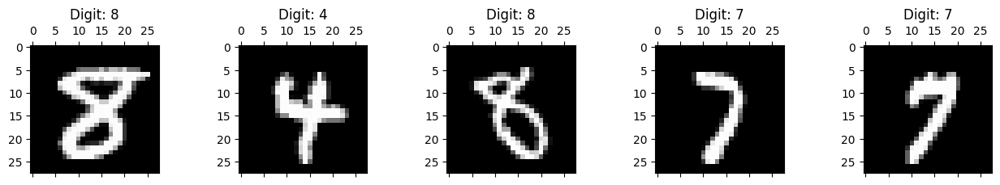

In [7]:
# We now have our DataFrame and our randomization vector. Now, we can check what these numbers actually look like

# For reproducability of the results
np.random.seed(42)
rndperm = np.random.permutation(df.shape[0])

plt.gray()
fig = plt.figure( figsize=(16,7) )
for i in range(0,5):
    ax = fig.add_subplot(3,5,i+1, title="Digit: {}".format(str(df.loc[rndperm[i],'y'])) )
    ax.matshow(df.loc[rndperm[i],feat_cols].values.reshape((28,28)).astype(float))
    
plt.show()

## Lets apply PCA first
PCA is a technique used to reduce the number of dimensions in a data set while retaining the most information. It uses the correlation between some dimensions and tries to provide a minimum number of variables that keeps the maximum amount of variation or information about how the original data is distributed. 

Since we like our two- and three-dimensional plots, let’s start with that and generate from the original 784 dimensions, the first three principal components. We’ll also see how much of the variation in the total data set they actually account for.

In [8]:
pca = PCA(n_components=3)
pca_result = pca.fit_transform(df[feat_cols].values)

df['pca-one'] = pca_result[:,0]
df['pca-two'] = pca_result[:,1] 
df['pca-three'] = pca_result[:,2]

print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))

# Explained variation per principal component: [0.09746116 0.07155445 0.06149531]

Explained variation per principal component: [0.09746116 0.07155445 0.06149531]


Given that the first two components account for about (0.1 + 0.7= 0.17 ) 17 percent of the variation in the entire data set, let’s see if that is enough to visually set the different digits apart. We can create a scatterplot of the first and second principal component and color each of the different types of digits with a different color. If we are lucky, the same type of digits will be positioned, or  clustered, together in groups. This would mean that the first two principal components actually tell us a great deal about the specific types of digits.

<Axes: xlabel='pca-one', ylabel='pca-two'>

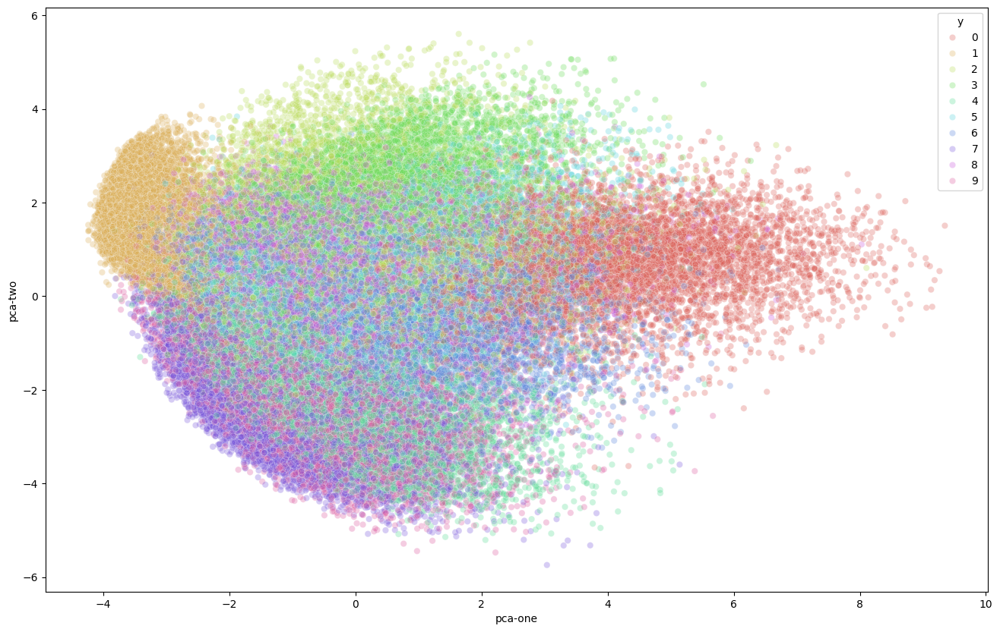

In [9]:
plt.figure(figsize=(16,10))
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df.loc[rndperm,:],
    legend="full",
    alpha=0.3
)

We can see the two components definitely hold some information, especially for specific digits. But it’s not enough to set all of them apart. 

Now lets plot above using first 3 principle components and see if it helps

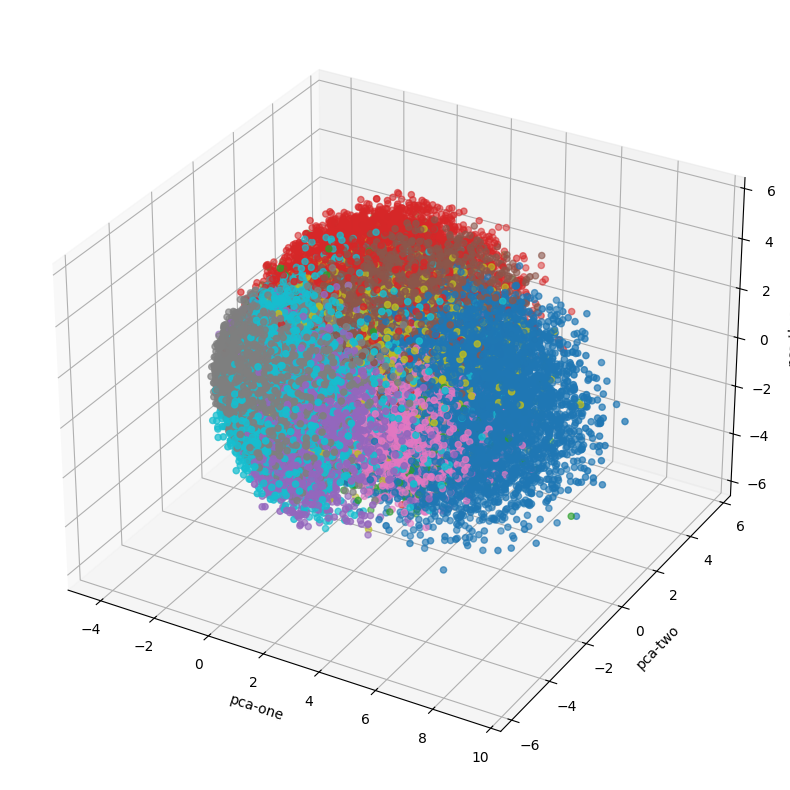

In [10]:
# TODO Use plotly here
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(111, projection='3d')  # Correct way to create a 3D plot

ax.scatter(
    xs=df.loc[rndperm,:]["pca-one"], 
    ys=df.loc[rndperm,:]["pca-two"], 
    zs=df.loc[rndperm,:]["pca-three"], 
    c=df.loc[rndperm,:]["y"], 
    cmap='tab10'
)
ax.set_xlabel('pca-one')
ax.set_ylabel('pca-two')
ax.set_zlabel('pca-three')
plt.show()

# Optional
Lets plot above using plotly for different visuals

In [11]:
# OPtional...
import plotly.express as px # have to install plotly

fig = px.scatter_3d(
    df.loc[rndperm, :], 
    x='pca-one', 
    y='pca-two', 
    z='pca-three', 
    color='y',  # Color based on 'y' column
    color_continuous_scale='turbo'  # Similar to 'tab10'
)

fig.update_layout(
    scene=dict(
        xaxis_title='pca-one',
        yaxis_title='pca-two',
        zaxis_title='pca-three'
    ),
    title='3D PCA Scatter Plot'
)

fig.show()


# Lets work on smaller dataset: 10000 images
## t-SNE

we will first try to run the t-SNE algorithm on the actual dimensions of the data (784) and see how it does. We’ll only use the first 10,000 samples to run the algorithm on to make sure we don’t burden our machine in terms of memory and power/time.

Lets run the PCA again on this 10000 subset to compare.

In [88]:
N = 10000

df_subset = df.loc[rndperm[:N],:].copy()

data_subset = df_subset[feat_cols].values

pca = PCA(n_components=3)
pca_result = pca.fit_transform(data_subset)

df_subset['pca-one'] = pca_result[:,0]
df_subset['pca-two'] = pca_result[:,1] 
df_subset['pca-three'] = pca_result[:,2]

print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))

# [out] Explained variation per principal component: [0.09730166 0.07135901 0.06183721]

Explained variation per principal component: [0.1  0.07 0.06]


In [62]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

# [out] [t-SNE] Computing 121 nearest neighbors...
# [t-SNE] Indexed 10000 samples in 0.564s...
# [t-SNE] Computed neighbors for 10000 samples in 121.191s...
# [t-SNE] Computed conditional probabilities for sample 1000 / 10000
# [t-SNE] Computed conditional probabilities for sample 2000 / 10000
# [t-SNE] Computed conditional probabilities for sample 3000 / 10000
# [t-SNE] Computed conditional probabilities for sample 4000 / 10000
# [t-SNE] Computed conditional probabilities for sample 5000 / 10000
# [t-SNE] Computed conditional probabilities for sample 6000 / 10000
# [t-SNE] Computed conditional probabilities for sample 7000 / 10000
# [t-SNE] Computed conditional probabilities for sample 8000 / 10000
# [t-SNE] Computed conditional probabilities for sample 9000 / 10000
# [t-SNE] Computed conditional probabilities for sample 10000 / 10000
# [t-SNE] Mean sigma: 2.129023
# [t-SNE] KL divergence after 250 iterations with early exaggeration: 85.957787
# [t-SNE] KL divergence after 300 iterations: 2.823509
# t-SNE done! Time elapsed: 157.3975932598114 seconds

c:\Users\hi\Desktop\projects\python_projects\tutorial\tut_tensorflow\.venv\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.053s...
[t-SNE] Computed neighbors for 10000 samples in 2.167s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 2.117974
[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.848083
[t-SNE] KL divergence after 300 iterations: 2.770878
t-SNE done! Time elapsed:

Now that we have the two resulting dimensions, we can create a scatter plot of the two dimensions and color each sample by its respective label to visualize them.

<Axes: xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

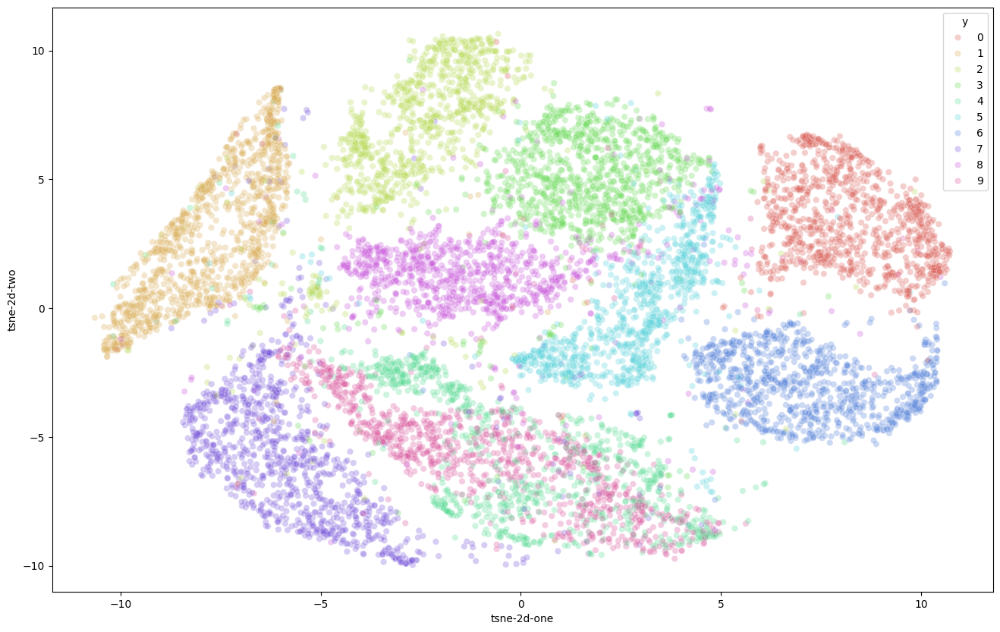

In [63]:
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3
)

<Axes: xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

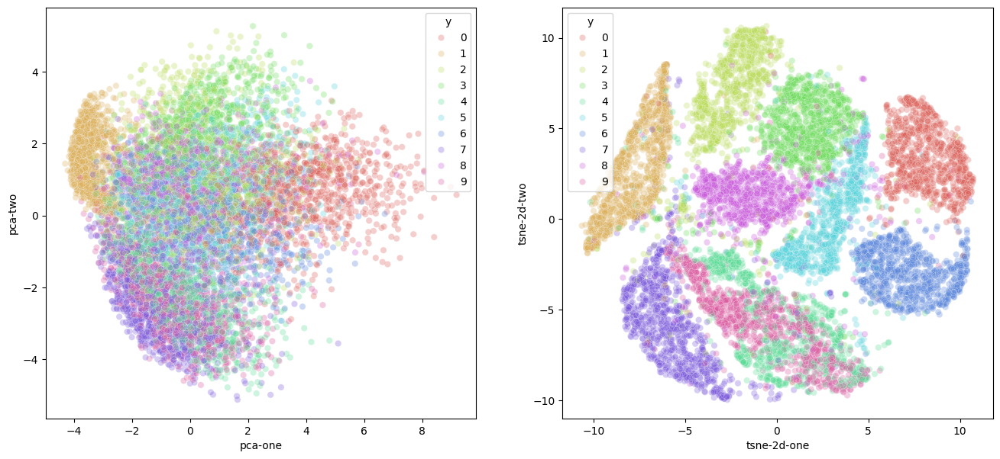

In [64]:
plt.figure(figsize=(16,7))

ax1 = plt.subplot(1, 2, 1)
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3,
    ax=ax1
)

ax2 = plt.subplot(1, 2, 2)
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3,
    ax=ax2
)

In [65]:
pca_50 = PCA(n_components=50)
pca_result_50 = pca_50.fit_transform(data_subset)

print('Cumulative explained variation for 50 principal components: {}'.format(np.sum(pca_50.explained_variance_ratio_)))

# [out] Cumulative explained variation for 50 principal components: 0.8267618822147329

Cumulative explained variation for 50 principal components: 0.8262021893487207


In [66]:
time_start = time.time()

tsne = TSNE(n_components=2, verbose=0, perplexity=40, n_iter=300)
tsne_pca_results = tsne.fit_transform(pca_result_50)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

# [out] t-SNE done! Time elapsed: 42.01495909690857 seconds

c:\Users\hi\Desktop\projects\python_projects\tutorial\tut_tensorflow\.venv\Lib\site-packages\sklearn\manifold\_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


t-SNE done! Time elapsed: 20.1720552444458 seconds


This is a significant improvement over the PCA visualization we used earlier. We can see that the digits are very clearly clustered in their own sub groups. 

**If we used a clustering algorithm to pick out the separate clusters, we could probably quite accurately assign new points to a label**

 ### Lets compare PCA and t-SNE side by side:

<Axes: xlabel='tsne-pca50-one', ylabel='tsne-pca50-two'>

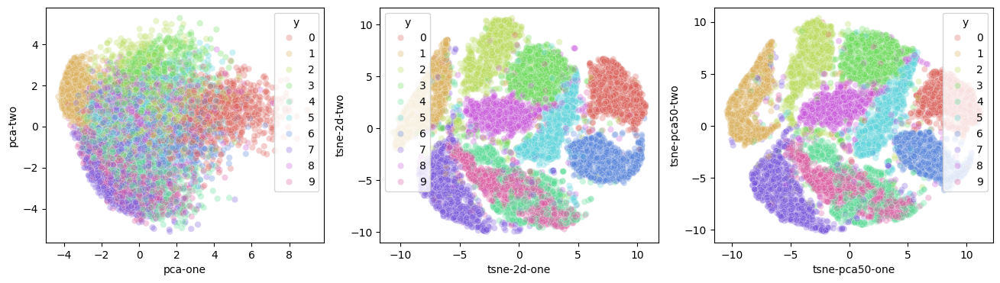

In [67]:
df_subset['tsne-pca50-one'] = tsne_pca_results[:,0]
df_subset['tsne-pca50-two'] = tsne_pca_results[:,1]
plt.figure(figsize=(16,4))
ax1 = plt.subplot(1, 3, 1)
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3,
    ax=ax1
)
ax2 = plt.subplot(1, 3, 2)
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3,
    ax=ax2
)

ax3 = plt.subplot(1, 3, 3)
sns.scatterplot(
    x="tsne-pca50-one", y="tsne-pca50-two",
    hue="y",
    palette=sns.color_palette("hls", 10),
    data=df_subset,
    legend="full",
    alpha=0.3,
    ax=ax3
)